<a href="https://colab.research.google.com/github/deepakmisal24/Counting-Objects-and-Face-Detection-using-YOLO-Model/blob/main/mini_project_image_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 922.2/922.2 kB 28.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 51.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 46.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 31.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 72.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
!pip install opencv-python-headless


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Saving WhatsApp Image 2024-12-16 at 16.58.39.jpeg to WhatsApp Image 2024-12-16 at 16.58.39.jpeg


100%|██████████| 6.25M/6.25M [00:00<00:00, 87.1MB/s]


YOLO model loaded successfully!

0: 640x480 3 persons, 1 cup, 2 tvs, 2 mouses, 1 keyboard, 414.1ms
Speed: 24.0ms preprocess, 414.1ms inference, 38.2ms postprocess per image at shape (1, 3, 640, 480)
- keyboard with confidence 92.22%
- tv with confidence 86.02%
- person with confidence 76.28%
- person with confidence 67.73%
- person with confidence 61.54%
- mouse with confidence 50.42%
- mouse with confidence 39.35%
- cup with confidence 30.38%
- tv with confidence 28.56%
Total persons detected: 3


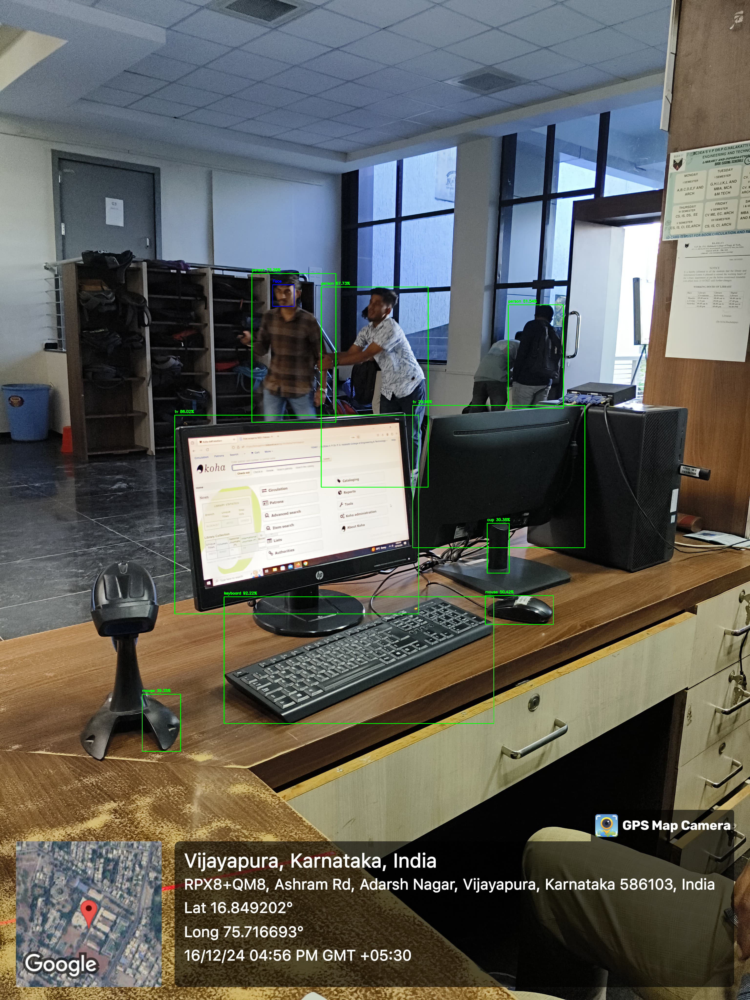

In [ ]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
from google.colab import files

def upload_and_detect_faces():
    uploaded = files.upload()
    image_path = list(uploaded.keys())[0]
    image = cv2.imread(image_path)

    if image is None:
        print("Error: Unable to read the image. Please check the path.")
        return

    try:
        model = YOLO("yolov8n.pt")
        print("YOLO model loaded successfully!")
    except Exception as e:
        print(f"Error loading YOLO model: {e}")
        return

    results = model(image)
    detections = results[0] #detected objects
    total_objects = len(detections.boxes) #counting number of detected objects

    human_boxes = [] #to store total recognised faces
    for box in detections.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        label = int(box.cls[0])
        confidence = box.conf[0] * 100
        class_name = model.names[label]

        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2) #box on detected object
        cv2.putText(image, f"{class_name} {confidence:.2f}%",  (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2) #add labels on the image
        print(f"- {class_name} with confidence {confidence:.2f}%")

        if model.names[label] == "person":
            human_boxes.append(box)

    print(f"Total persons detected: {len(human_boxes)}")

    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    if face_cascade.empty():
        print("Error loading Haar Cascade!")
        return
    for human_box in human_boxes:
        x1, y1, x2, y2 = map(int, human_box.xyxy[0])
        person_roi = image[y1:y2, x1:x2]
        if person_roi.size == 0:
            print(f"Skipping empty ROI for bounding box ({x1}, {y1}, {x2}, {y2})")
            continue

        faces = face_cascade.detectMultiScale(person_roi, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
        for (fx, fy, fw, fh) in faces:
            face_x1, face_y1 = x1 + fx, y1 + fy
            face_x2, face_y2 = face_x1 + fw, face_y1 + fh
            cv2.rectangle(image, (face_x1, face_y1), (face_x2, face_y2), (255, 0, 0), 2)
            cv2.putText(image, "Face", (face_x1, face_y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    cv2.imwrite("output_with_boxes.jpg", image)
    cv2_imshow(image)

upload_and_detect_faces()
